In [1]:
# HomeWork Day3

In [2]:
import pandas as pd # veri dosyasını okuma ve manipüle etme paketi
import sqlite3
import matplotlib.pyplot as plt

In [3]:
df = pd.read_csv('kc_house_data.csv')

In [4]:
df.head() # ilk 5 satır

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [5]:
df.tail()  # son 5 satır

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
21608,263000018,20140521T000000,360000.0,3,2.50,1530,1131,3.0,0,0,...,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509
21609,6600060120,20150223T000000,400000.0,4,2.50,2310,5813,2.0,0,0,...,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200
21610,1523300141,20140623T000000,402101.0,2,0.75,1020,1350,2.0,0,0,...,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007
21611,291310100,20150116T000000,400000.0,3,2.50,1600,2388,2.0,0,0,...,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287
21612,1523300157,20141015T000000,325000.0,2,0.75,1020,1076,2.0,0,0,...,7,1020,0,2008,0,98144,47.5941,-122.299,1020,1357


In [6]:
df.shape # satır ve sütun sayisi

(21613, 21)

In [7]:
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [8]:
df.isnull().sum() # hangi sutunda kac bos veri var

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [9]:
df.describe() # istatistik verir

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [10]:
df.corr(numeric_only= True)

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
id,1.000000,-0.016762,0.001286,0.005160,-0.012258,-0.132109,0.018525,-0.002721,0.011592,-0.023783,0.008130,-0.010842,-0.005151,0.021380,-0.016907,-0.008224,-0.001891,0.020799,-0.002901,-0.138798
price,-0.016762,1.000000,0.308350,0.525138,0.702035,0.089661,0.256794,0.266369,0.397293,0.036362,0.667434,0.605567,0.323816,0.054012,0.126434,-0.053203,0.307003,0.021626,0.585379,0.082447
bedrooms,0.001286,0.308350,1.000000,0.515884,0.576671,0.031703,0.175429,-0.006582,0.079532,0.028472,0.356967,0.477600,0.303093,0.154178,0.018841,-0.152668,-0.008931,0.129473,0.391638,0.029244
bathrooms,0.005160,0.525138,0.515884,1.000000,0.754665,0.087740,0.500653,0.063744,0.187737,-0.124982,0.664983,0.685342,0.283770,0.506019,0.050739,-0.203866,0.024573,0.223042,0.568634,0.087175
sqft_living,-0.012258,0.702035,0.576671,0.754665,1.000000,0.172826,0.353949,0.103818,0.284611,-0.058753,0.762704,0.876597,0.435043,0.318049,0.055363,-0.199430,0.052529,0.240223,0.756420,0.183286
sqft_lot,-0.132109,0.089661,0.031703,0.087740,0.172826,1.000000,-0.005201,0.021604,0.074710,-0.008958,0.113621,0.183512,0.015286,0.053080,0.007644,-0.129574,-0.085683,0.229521,0.144608,0.718557
floors,0.018525,0.256794,0.175429,0.500653,0.353949,-0.005201,1.000000,0.023698,0.029444,-0.263768,0.458183,0.523885,-0.245705,0.489319,0.006338,-0.059121,0.049614,0.125419,0.279885,-0.011269
waterfront,-0.002721,0.266369,-0.006582,0.063744,0.103818,0.021604,0.023698,1.000000,0.401857,0.016653,0.082775,0.072075,0.080588,-0.026161,0.092885,0.030285,-0.014274,-0.041910,0.086463,0.030703
view,0.011592,0.397293,0.079532,0.187737,0.284611,0.074710,0.029444,0.401857,1.000000,0.045990,0.251321,0.167649,0.276947,-0.053440,0.103917,0.084827,0.006157,-0.078400,0.280439,0.072575
condition,-0.023783,0.036362,0.028472,-0.124982,-0.058753,-0.008958,-0.263768,0.016653,0.045990,1.000000,-0.144674,-0.158214,0.174105,-0.361417,-0.060618,0.003026,-0.014941,-0.106500,-0.092824,-0.003406


In [11]:
import seaborn as sns

<Axes: >

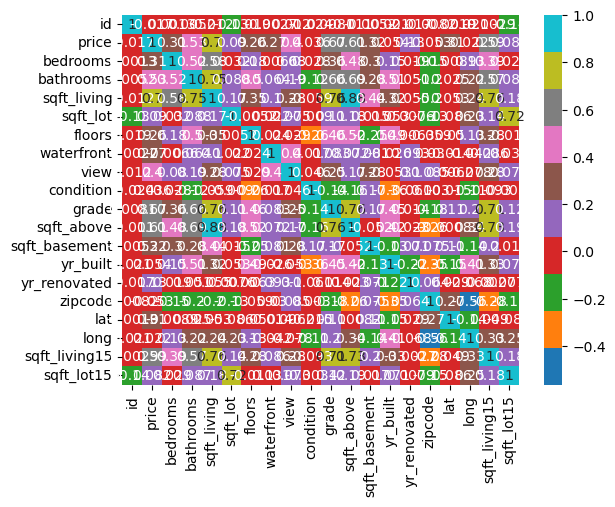

In [12]:
sns.heatmap(df.corr(numeric_only= True),annot = True , cmap= 'tab10' )

In [13]:
df['bathrooms'].unique() # Tekil veriler

array([1.  , 2.25, 3.  , 2.  , 4.5 , 1.5 , 2.5 , 1.75, 2.75, 3.25, 4.  ,
       3.5 , 0.75, 4.75, 5.  , 4.25, 3.75, 0.  , 1.25, 5.25, 6.  , 0.5 ,
       5.5 , 6.75, 5.75, 8.  , 7.5 , 7.75, 6.25, 6.5 ])

In [14]:
df['bathrooms'].value_counts()

bathrooms
2.50    5380
1.00    3852
1.75    3048
2.25    2047
2.00    1930
1.50    1446
2.75    1185
3.00     753
3.50     731
3.25     589
3.75     155
4.00     136
4.50     100
4.25      79
0.75      72
4.75      23
5.00      21
5.25      13
0.00      10
5.50      10
1.25       9
6.00       6
0.50       4
5.75       4
6.75       2
8.00       2
6.50       2
6.25       2
7.75       1
7.50       1
Name: count, dtype: int64

In [15]:
df['bathrooms'].value_counts(normalize = True)

bathrooms
2.50    0.248924
1.00    0.178226
1.75    0.141026
2.25    0.094712
2.00    0.089298
1.50    0.066904
2.75    0.054828
3.00    0.034840
3.50    0.033822
3.25    0.027252
3.75    0.007172
4.00    0.006293
4.50    0.004627
4.25    0.003655
0.75    0.003331
4.75    0.001064
5.00    0.000972
5.25    0.000601
0.00    0.000463
5.50    0.000463
1.25    0.000416
6.00    0.000278
0.50    0.000185
5.75    0.000185
6.75    0.000093
8.00    0.000093
6.50    0.000093
6.25    0.000093
7.75    0.000046
7.50    0.000046
Name: proportion, dtype: float64

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29],
 [Text(0, 0, '0.0'),
  Text(1, 0, '0.5'),
  Text(2, 0, '0.75'),
  Text(3, 0, '1.0'),
  Text(4, 0, '1.25'),
  Text(5, 0, '1.5'),
  Text(6, 0, '1.75'),
  Text(7, 0, '2.0'),
  Text(8, 0, '2.25'),
  Text(9, 0, '2.5'),
  Text(10, 0, '2.75'),
  Text(11, 0, '3.0'),
  Text(12, 0, '3.25'),
  Text(13, 0, '3.5'),
  Text(14, 0, '3.75'),
  Text(15, 0, '4.0'),
  Text(16, 0, '4.25'),
  Text(17, 0, '4.5'),
  Text(18, 0, '4.75'),
  Text(19, 0, '5.0'),
  Text(20, 0, '5.25'),
  Text(21, 0, '5.5'),
  Text(22, 0, '5.75'),
  Text(23, 0, '6.0'),
  Text(24, 0, '6.25'),
  Text(25, 0, '6.5'),
  Text(26, 0, '6.75'),
  Text(27, 0, '7.5'),
  Text(28, 0, '7.75'),
  Text(29, 0, '8.0')])

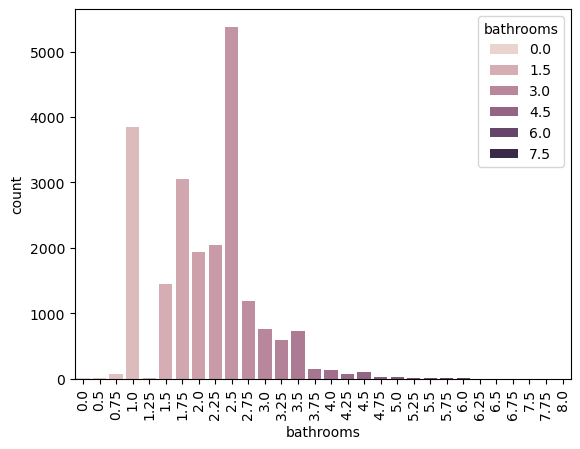

In [16]:
sns.countplot(x = df['bathrooms'] , hue =df['bathrooms'])
plt.xticks(rotation = 90)

<Axes: xlabel='count', ylabel='bathrooms'>

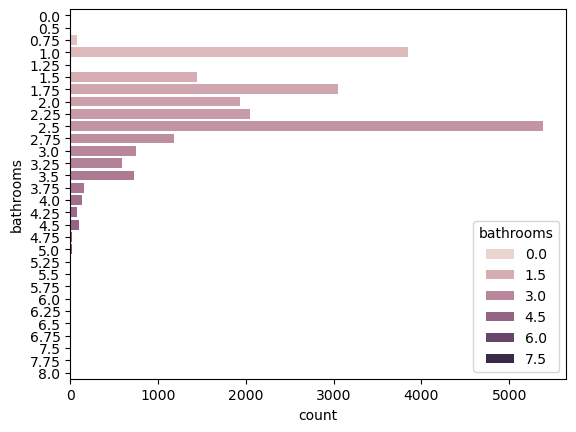

In [17]:
sns.countplot(y = df['bathrooms'] , hue =df['bathrooms'])

<Axes: xlabel='floors', ylabel='count'>

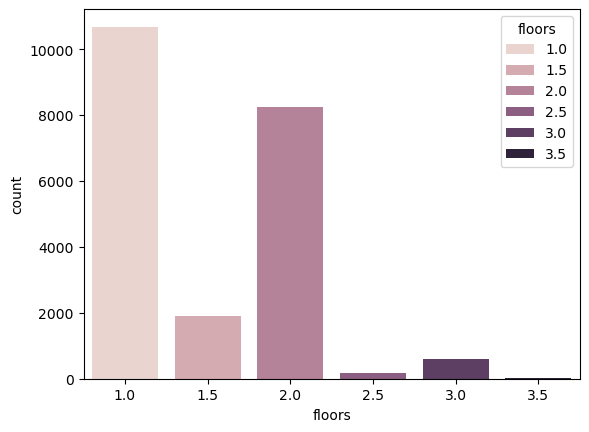

In [18]:
sns.countplot(x = df['floors'] , hue =df['floors'])

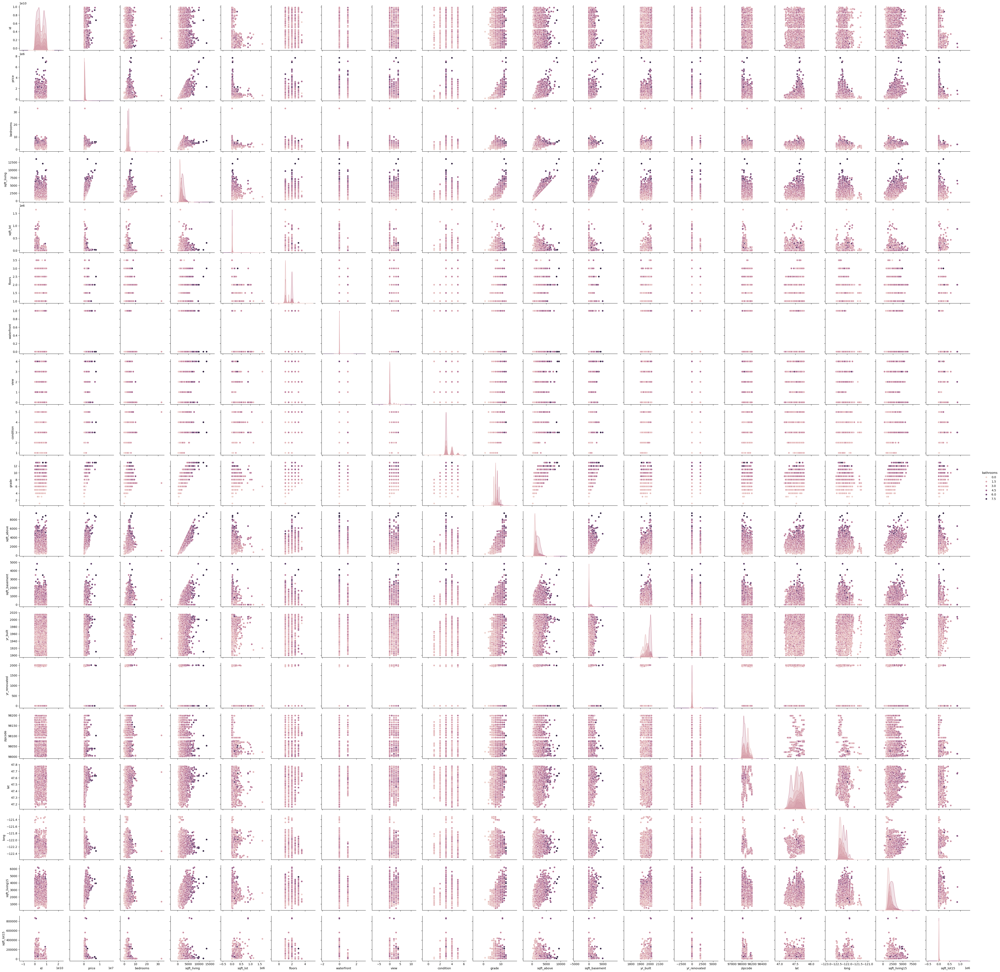

In [19]:
sns.pairplot(df , hue = 'bathrooms') # her sutunun her sutuna göre degisimi

In [20]:
from scipy.stats import ttest_ind

In [21]:
_,p=ttest_ind(df['floors'], df['bathrooms']) # p degerini hesapladik

<Axes: xlabel='floors', ylabel='Density'>

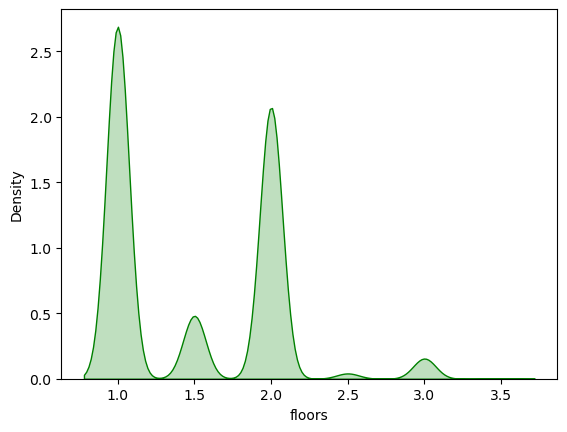

In [22]:
sns.kdeplot(x = df['floors'], fill = True , color = 'green' )

<Axes: >

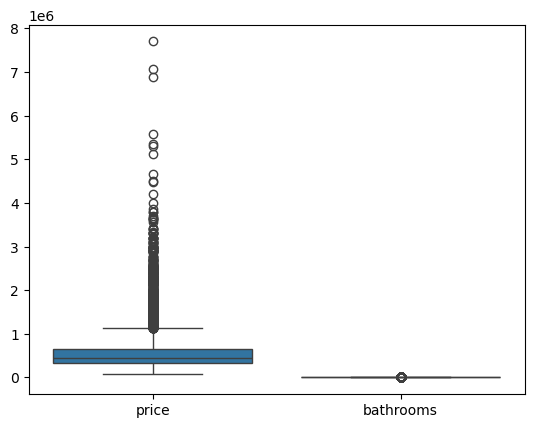

In [23]:
sns.boxplot([df['price'], df['bathrooms']])

<Axes: xlabel='bathrooms', ylabel='price'>

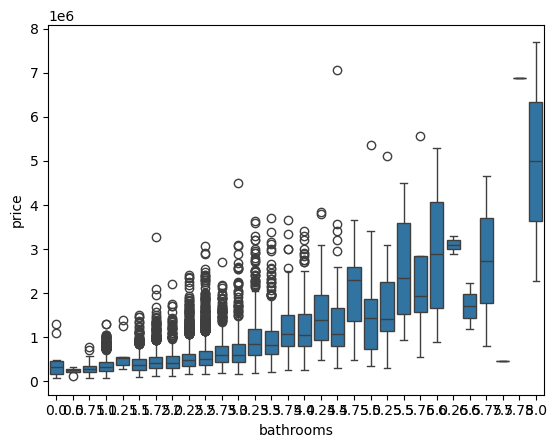

In [24]:
sns.boxplot(x = df['bathrooms'],y= df['price'])

C:\Users\USER\AppData\Local\Temp\ipykernel_18572\3120889686.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x = 'floors', y = 'bathrooms' , data = df , palette = 'magma' )


<Axes: xlabel='floors', ylabel='bathrooms'>

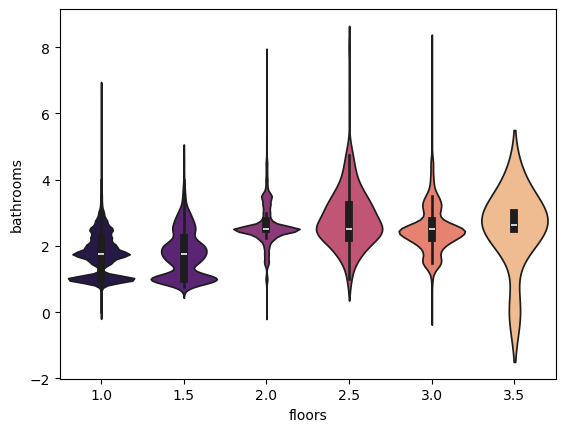

In [25]:
sns.violinplot(x = 'floors', y = 'bathrooms' , data = df , palette = 'magma' )

In [26]:
import plotly.express as px

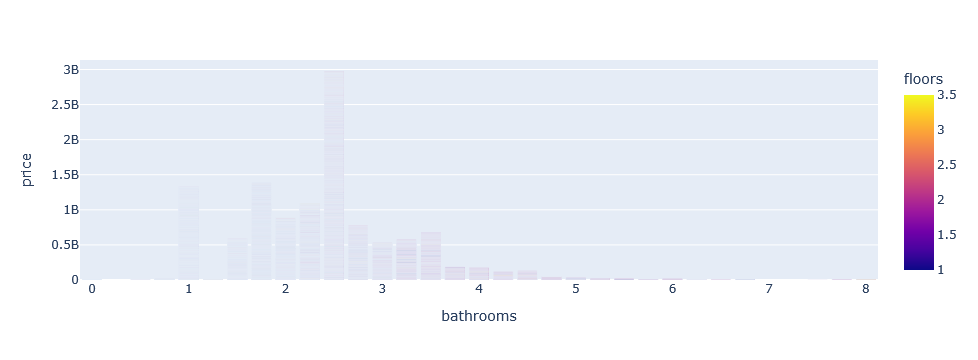

In [28]:
px.bar (df , x ='bathrooms', y ='price' , color = 'floors' )

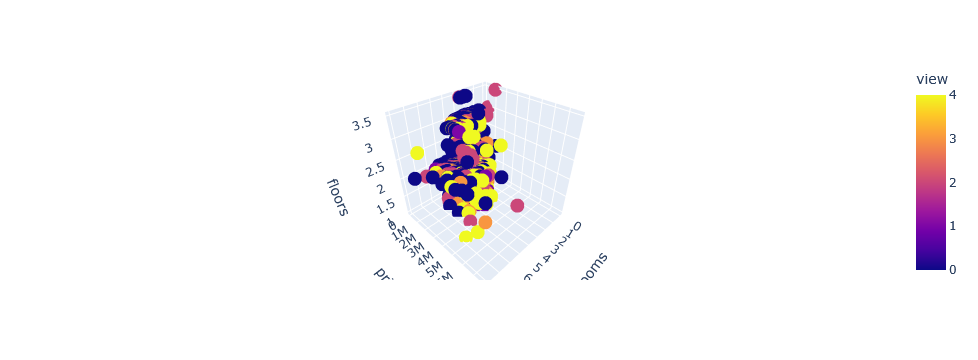

In [30]:
px.scatter_3d(df , x ='bathrooms', y ='price' , color = 'view' , z = 'floors' )

Feature Engineering

In [31]:
df.corr(numeric_only= True) 

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
id,1.000000,-0.016762,0.001286,0.005160,-0.012258,-0.132109,0.018525,-0.002721,0.011592,-0.023783,0.008130,-0.010842,-0.005151,0.021380,-0.016907,-0.008224,-0.001891,0.020799,-0.002901,-0.138798
price,-0.016762,1.000000,0.308350,0.525138,0.702035,0.089661,0.256794,0.266369,0.397293,0.036362,0.667434,0.605567,0.323816,0.054012,0.126434,-0.053203,0.307003,0.021626,0.585379,0.082447
bedrooms,0.001286,0.308350,1.000000,0.515884,0.576671,0.031703,0.175429,-0.006582,0.079532,0.028472,0.356967,0.477600,0.303093,0.154178,0.018841,-0.152668,-0.008931,0.129473,0.391638,0.029244
bathrooms,0.005160,0.525138,0.515884,1.000000,0.754665,0.087740,0.500653,0.063744,0.187737,-0.124982,0.664983,0.685342,0.283770,0.506019,0.050739,-0.203866,0.024573,0.223042,0.568634,0.087175
sqft_living,-0.012258,0.702035,0.576671,0.754665,1.000000,0.172826,0.353949,0.103818,0.284611,-0.058753,0.762704,0.876597,0.435043,0.318049,0.055363,-0.199430,0.052529,0.240223,0.756420,0.183286
sqft_lot,-0.132109,0.089661,0.031703,0.087740,0.172826,1.000000,-0.005201,0.021604,0.074710,-0.008958,0.113621,0.183512,0.015286,0.053080,0.007644,-0.129574,-0.085683,0.229521,0.144608,0.718557
floors,0.018525,0.256794,0.175429,0.500653,0.353949,-0.005201,1.000000,0.023698,0.029444,-0.263768,0.458183,0.523885,-0.245705,0.489319,0.006338,-0.059121,0.049614,0.125419,0.279885,-0.011269
waterfront,-0.002721,0.266369,-0.006582,0.063744,0.103818,0.021604,0.023698,1.000000,0.401857,0.016653,0.082775,0.072075,0.080588,-0.026161,0.092885,0.030285,-0.014274,-0.041910,0.086463,0.030703
view,0.011592,0.397293,0.079532,0.187737,0.284611,0.074710,0.029444,0.401857,1.000000,0.045990,0.251321,0.167649,0.276947,-0.053440,0.103917,0.084827,0.006157,-0.078400,0.280439,0.072575
condition,-0.023783,0.036362,0.028472,-0.124982,-0.058753,-0.008958,-0.263768,0.016653,0.045990,1.000000,-0.144674,-0.158214,0.174105,-0.361417,-0.060618,0.003026,-0.014941,-0.106500,-0.092824,-0.003406


In [32]:
abs(df.corr(numeric_only= True)['bathrooms'].sort_values(ascending = False)) 

bathrooms        1.000000
sqft_living      0.754665
sqft_above       0.685342
grade            0.664983
sqft_living15    0.568634
price            0.525138
bedrooms         0.515884
yr_built         0.506019
floors           0.500653
sqft_basement    0.283770
long             0.223042
view             0.187737
sqft_lot         0.087740
sqft_lot15       0.087175
waterfront       0.063744
yr_renovated     0.050739
lat              0.024573
id               0.005160
condition        0.124982
zipcode          0.203866
Name: bathrooms, dtype: float64

In [33]:
x= df[['bathrooms','price','floors']]

In [34]:
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [35]:
y = df[['bathrooms']]

In [36]:
from sklearn.model_selection import train_test_split # Test ve eğitim verisi oluşturmak için datayı 2 ye böler

In [37]:
x_train , x_test, y_train , y_test = train_test_split(x , y , test_size= 0.20, random_state = 42)

In [38]:
from sklearn.linear_model import LinearRegression # Linear Regression makine öğrenmesi modeli

In [39]:
Lr = LinearRegression()

In [40]:
model = Lr.fit(x_train , y_train) # model eğitildi

In [41]:
_predict = model.predict(x_test) # tahminler degiskene atandi

In [42]:
_predict

array([[2.25],
       [3.  ],
       [2.5 ],
       ...,
       [2.5 ],
       [1.75],
       [2.5 ]])

In [43]:
from sklearn.metrics import r2_score , mean_squared_error

In [44]:
mean_squared_error(y_test,_predict)** 0.5 # araba başına ortalama hata

4.1732265601242755e-12

In [45]:
r2_score(y_test,_predict) # basari oranı 0-1 arası eger negatif cikarsa cook buyuk bir hata var demektir.

1.0

In [46]:
x= df[['bathrooms','floors','view','condition','grade']]
y = df['bathrooms']

In [47]:
x.head(2)

,bathrooms,floors,view,condition,grade
0,1.00,1.0,0,3,7
1,2.25,2.0,0,3,7


In [48]:
x = pd.get_dummies(x,drop_first=True) # metin olan sutunlari sayiya cevirdi

In [49]:
x.head()

,bathrooms,floors,view,condition,grade
0,1.00,1.0,0,3,7
1,2.25,2.0,0,3,7
2,1.00,1.0,0,3,6
3,3.00,1.0,0,5,7
4,2.00,1.0,0,3,8


In [50]:
x_train , x_test, y_train , y_test = train_test_split(x , y , test_size= 0.20, random_state = 42)

In [51]:
model = Lr.fit(x_train , y_train) # model eğitildi

In [52]:
_predict = model.predict(x_test) # tahminler degiskene atandi

In [53]:
mean_squared_error(y_test,_predict)** 0.5 # araba başına ortalama hata

6.4973101617264874e-15

In [54]:
r2_score(y_test,_predict) # basari oranı 0-1 arası eger negatif cikarsa cook buyuk bir hata var demektir.

1.0

In [55]:
from sklearn.linear_model import Ridge, Lasso, ElasticNet

In [56]:
R = Ridge()
L = Lasso()
E = ElasticNet()

In [57]:
Rmodel = R.fit(x_train , y_train)

In [58]:
predictR = Rmodel.predict(x_test)

In [59]:
r2_score(y_test,predictR)

0.9999999806603163

In [60]:
L.fit(x_train, y_train)

Lasso()

In [61]:
predictL = L.predict(x_test)

In [62]:
r2_score(y_test,predictL)

-3.777790089065647e-05

In [63]:
E.fit(x_train, y_train)

ElasticNet()

In [64]:
predictE = E.predict(x_test)

In [65]:
r2_score(y_test,predictE)

0.18052409182975315

In [66]:
Lr.coef_

array([ 1.00000000e+00,  2.56476828e-17, -2.61590075e-17,  1.14557404e-16,
        1.39003436e-16])

In [67]:
feature_importance= pd.DataFrame({'Feature': x_train.columns, 'Coefs': Lr.coef_})

In [68]:
feature_importance

,Feature,Coefs
0,bathrooms,1.000000e+00
1,floors,2.564768e-17
2,view,-2.615901e-17
3,condition,1.145574e-16
4,grade,1.390034e-16


<BarContainer object of 5 artists>

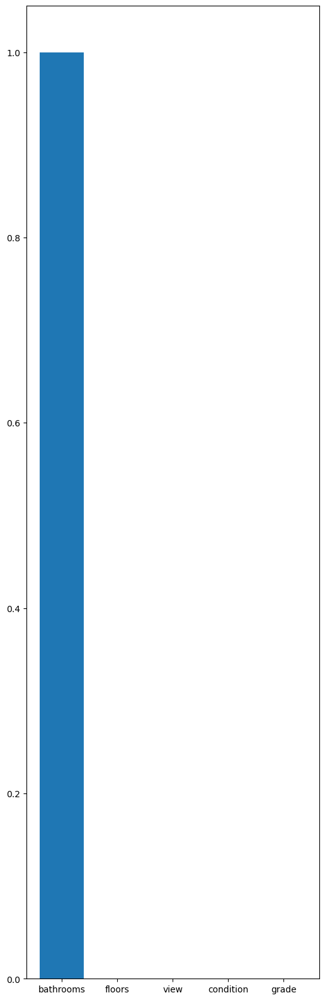

In [69]:
plt.figure(figsize= (6,20))
plt.bar(feature_importance['Feature'],feature_importance['Coefs'] )

In [70]:
residuals = y_test - _predict

In [71]:
residuals

735      8.881784e-16
2830     7.105427e-15
4106     3.108624e-15
16218    1.065814e-14
19964    3.108624e-15
             ...     
13674   -3.108624e-15
20377    4.884981e-15
8805     3.108624e-15
10168   -3.330669e-15
2522     3.108624e-15
Name: bathrooms, Length: 4323, dtype: float64

<Axes: xlabel='bathrooms', ylabel='Density'>

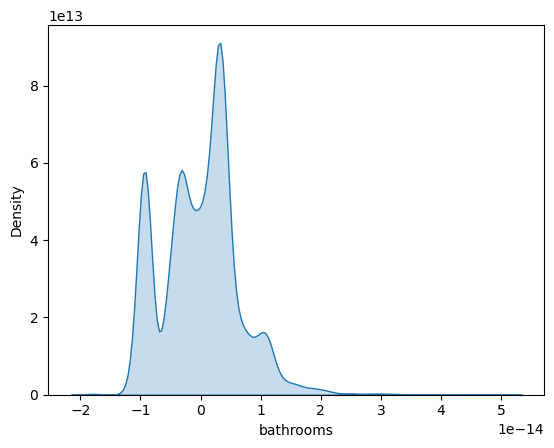

In [72]:
sns.kdeplot(x=residuals, fill=True)

In [73]:
from yellowbrick.regressor import ResidualsPlot

C:\Users\USER\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



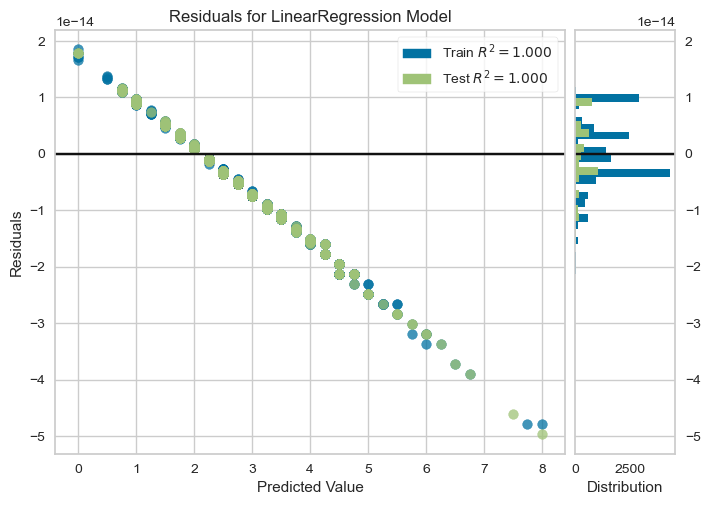

In [74]:
vls=ResidualsPlot(Lr)
vls.fit(x_train, y_train)
vls.score(x_test,y_test)
vls.show()
plt.show()

In [75]:
from sklearn.preprocessing import MinMaxScaler

In [76]:
x.head()

,bathrooms,floors,view,condition,grade
0,1.00,1.0,0,3,7
1,2.25,2.0,0,3,7
2,1.00,1.0,0,3,6
3,3.00,1.0,0,5,7
4,2.00,1.0,0,3,8


In [77]:
x = MinMaxScaler().fit_transform(x)

In [78]:
x


array([[0.125     , 0.        , 0.        , 0.5       , 0.5       ],
       [0.28125   , 0.4       , 0.        , 0.5       , 0.5       ],
       [0.125     , 0.        , 0.        , 0.5       , 0.41666667],
       ...,
       [0.09375   , 0.4       , 0.        , 0.5       , 0.5       ],
       [0.3125    , 0.4       , 0.        , 0.5       , 0.58333333],
       [0.09375   , 0.4       , 0.        , 0.5       , 0.5       ]])

In [79]:
x_train , x_test, y_train , y_test = train_test_split(x , y , test_size= 0.20, random_state = 42)

In [80]:
Lr.fit(x_train,y_train)

LinearRegression()

In [81]:
tahmin = Lr.predict(x_test)

In [82]:
r2_score(y_test, tahmin)

1.0

In [83]:
 # Linear olmayan modeller

In [84]:
from sklearn.tree import DecisionTreeRegressor

In [85]:
dt = DecisionTreeRegressor()

In [86]:
dt.fit(x_train, y_train)

DecisionTreeRegressor()

In [87]:
tahmindt = dt.predict(x_test)

In [88]:
r2_score(y_test, tahmindt)

0.9981629736968565

In [89]:
from sklearn.ensemble import ExtraTreesRegressor

In [90]:
ET= ExtraTreesRegressor()

In [91]:
ET.fit(x_train, y_train)

ExtraTreesRegressor()

In [92]:
tahminET = ET.predict(x_test)

In [93]:
r2_score(y_test,tahminET)

0.9995672201545986

In [94]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [95]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
pd.set_option("display.max_columns",100)

from sklearn.linear_model import LinearRegression,SGDRegressor,Ridge,Lasso,ElasticNet
from sklearn.neighbors import KNeighborsRegressor, RadiusNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor,AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor, plot_tree, ExtraTreeRegressor
#pip install xgboost
from xgboost import XGBRegressor
from sklearn.svm import SVR

from sklearn.neural_network import MLPRegressor

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

def algo_test(x,y):
        #Bütün modelleri tanımlıyorum
        L=LinearRegression()
        R=Ridge()
        Lass=Lasso()
        E=ElasticNet()
        sgd=SGDRegressor()
        ETR=ExtraTreeRegressor()
        GBR=GradientBoostingRegressor()
        kn=KNeighborsRegressor()
        rkn=RadiusNeighborsRegressor(radius=1.0)
        ada=AdaBoostRegressor()
        dt=DecisionTreeRegressor()
        xgb=XGBRegressor()
        svr=SVR()
        mlp_regressor = MLPRegressor()

       
        
        algos=[L,R,Lass,E,sgd,ETR,GBR,ada,kn,dt,xgb,svr,mlp_regressor]
        algo_names=['Linear','Ridge','Lasso','ElasticNet','SGD','Extra Tree','Gradient Boosting',
                    'KNeighborsRegressor','AdaBoost','Decision Tree','XGBRegressor','SVR','mlp_regressor']
        x=MinMaxScaler().fit_transform(x)
        x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=.20,random_state=42)
        
        r_squared= []
        rmse= []
        mae= []
        
        #Hata ve doğruluk oranlarını bir tablo haline getirmek için bir dataframe oluşturuyorum
        result=pd.DataFrame(columns=['R_Squared','RMSE','MAE'],index=algo_names)
        
        
        for algo in algos:
            p=algo.fit(x_train,y_train).predict(x_test)
            r_squared.append(r2_score(y_test,p))
            rmse.append(mean_squared_error(y_test,p)**.5)
            mae.append(mean_absolute_error(y_test,p))
        
            

        #result adlı tabloya doğruluk ve hata oranlarımı yerleştiriyorum
        result.R_Squared=r_squared
        result.RMSE=rmse
        result.MAE=mae
        
       #oluşturduğum result tablosunu doğruluk oranına (r2_score) göre sıralayıp dönüyor
        rtable=result.sort_values('R_Squared',ascending=False)
        return rtable

In [96]:
algo_test(x , y )

,R_Squared,RMSE,MAE
Linear,1.000000,6.578303e-15,5.218414e-15
Gradient Boosting,0.999977,3.788412e-03,9.293349e-05
Ridge,0.999923,6.865093e-03,5.287440e-03
Decision Tree,0.999859,9.313717e-03,2.313208e-04
XGBRegressor,0.999788,1.140823e-02,1.839276e-04
mlp_regressor,0.999246,2.151819e-02,3.341482e-03
Extra Tree,0.997174,4.165221e-02,1.503585e-03
SVR,0.991195,7.351983e-02,4.401642e-02
KNeighborsRegressor,0.985672,9.378519e-02,6.718213e-02
AdaBoost,0.979275,1.127947e-01,2.297016e-02


In [97]:
# End of Homework